In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
from utils import label_mapping_utils as lmu


COL_FOR_PLOT = "pause_dep"

# Read related TAF1 genes

https://academic.oup.com/nar/article/50/16/9127/6659871#supplementary-data

In [2]:
file_path = '/home/gdallagl/myworkdir/XDP/data/_old/Supplementary_Data_File.xlsx'

# This returns a dictionary: {'Sheet1': df1, 'Sheet2': df2, ...}
df = pd.read_excel(file_path, sheet_name="PRO-Seq truQuant quantification")

df = df[["Gene", "TAF1 Gene body-dependency", "TAF1 Pause region-dependency"]].dropna()

df.rename(
    columns=
    # so >1 means TAF1 loss reduced that signal. 
        {
        "Gene": "gene",
        "TAF1 Gene body-dependency": "body_dep", # It reflects productive elongation — how much polymerase escaped the pause and is actively transcribing through the gene. Computed as DMSO/dTAGV-1 of summed 3′ ends.
        "TAF1 Pause region-dependency": "pause_dep" #It reflects initiation + pausing — how much polymerase loaded onto the promoter and paused. Computed as DMSO/dTAGV-1 of summed 5′ ends.
    }, inplace=True)

df.sort_values(COL_FOR_PLOT, ascending=False, inplace=True)

df.to_csv("/home/gdallagl/myworkdir/XDP/data/_old/taf1_gene_dependency.csv", index=False)

df

,gene,body_dep,pause_dep
7140,RND3,1.979840,6.486622
7941,SMARCA2,1.709348,4.610129
4696,MAPK10,0.942029,4.595514
6823,RAB43,1.573474,4.000386
3260,GCNT4,1.990077,3.925087
...,...,...,...
3698,HIST1H2BJ,0.903060,0.827978
227,AGBL5,1.149499,0.804852
6037,PER3,1.460137,0.715169
1006,C12orf57,0.580209,0.655482


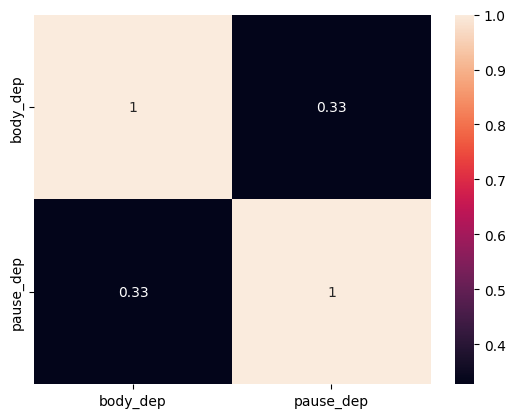

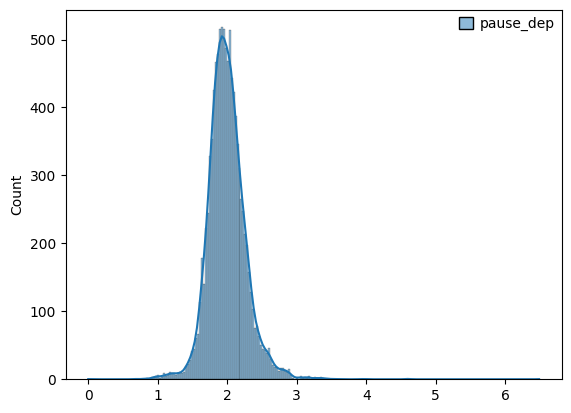

In [4]:

sns.heatmap(df[["body_dep", "pause_dep"]].corr(), annot=True);plt.show()
sns.histplot(df[["pause_dep"]], kde=True); plt.show()


### Whcih genes are the most related to taf1

In [11]:
# get too 95% quantile of TAF1 dependency
taf1_threshold = df[COL_FOR_PLOT].quantile(0.98)
print("TAF1 dependency threshold (95% quantile):", taf1_threshold)
df["is_taf1_dependent"] = df[COL_FOR_PLOT] >= taf1_threshold
print(f"Number of TAF1-dependent genes (top 5%): {df['is_taf1_dependent'].sum()} out of {len(df)} total genes.")
display(df[df["is_taf1_dependent"]].head())
print(df[df["is_taf1_dependent"]]["gene"].values)




df[df[COL_FOR_PLOT] <= 1]


TAF1 dependency threshold (95% quantile): 2.635357029249366
Number of TAF1-dependent genes (top 5%): 206 out of 10269 total genes.


,gene,body_dep,pause_dep,is_taf1_dependent
7140,RND3,1.979840,6.486622,True
7941,SMARCA2,1.709348,4.610129,True
4696,MAPK10,0.942029,4.595514,True
6823,RAB43,1.573474,4.000386,True
3260,GCNT4,1.990077,3.925087,True


['RND3' 'SMARCA2' 'MAPK10' 'RAB43' 'GCNT4' 'PTGER4' 'MYOF' 'SH3BP5' 'RTL5'
 'RAB32' 'SESN3' 'UBASH3B' 'CXCR4' 'DYNC1I1' 'PRKCG' 'PHLDA3' 'STARD9'
 'SLC7A8' 'NATD1' 'FGF13' 'TMEM191B' 'ARL3' 'CELF5' 'RNF122' 'SH2D5'
 'VLDLR' 'PROX1' 'APOBEC3G' 'EPHB1' 'PAG1' 'HERC3' 'ANK1' 'GBGT1' 'ABTB1'
 'BOC' 'CCNG2' 'UBALD2' 'CFAP221' 'HLCS' 'HSD17B6' 'COL19A1' 'SETMAR'
 'BDH2' 'CCDC68' 'CABIN1' 'RHBDF1' 'MAP2' 'ZSWIM4' 'MYT1' 'RALB' 'STARD6'
 'TMEM59' 'CCNA1' 'CDHR1' 'ENC1' 'RASL11B' 'BMP7' 'FLT1' 'STON1' 'DEGS2'
 'FAM221B' 'PNKD' 'ARHGAP26' 'TSPAN12' 'TFDP2' 'CPEB4' 'SNAI2' 'FGF9'
 'FAM129A' 'KCNN2' 'AMN1' 'EPAS1' 'HBP1' 'IGFBP5' 'ATF5' 'QTRT2' 'RYR2'
 'SPARC' 'PRSS35' 'CLSTN2' 'KBTBD4' 'RNF43' 'ZDHHC21' 'TSC1' 'VSIR' 'F8A1'
 'ZSWIM5' 'LRIG3' 'CSNK1E' 'NR5A2' 'PFKFB2' 'JMJD1C' 'MAOA' 'TXNDC16'
 'WNT9B' 'CNR1' 'SEZ6L2' 'NIPSNAP3A' 'KIAA1324L' 'TRAF2' 'CSRNP3' 'ELMOD1'
 'C1QL4' 'ZNF395' 'TES' 'SMPDL3A' 'RAB3IP' 'TENT5C' 'PPM1J' 'CCDC61'
 'INHA' 'EFCAB10' 'LZTS1' 'TBX2' 'ATG2A' 'LRRC49' 'ARHGEF6' 'KA

,gene,body_dep,pause_dep,is_taf1_dependent
3705,HIST1H3G,0.963526,0.997300,False
3849,HSPA8,1.040674,0.988250,False
3692,HIST1H2BC,0.988725,0.980912,False
3703,HIST1H3B,1.060517,0.973920,False
822,BAZ2A,1.286105,0.973663,False
3684,HIST1H2AB,0.940077,0.970496,False
3759,HMGN4,1.152911,0.961988,False
3681,HIST1H1C,1.187999,0.960523,False
5353,NCKAP5L,1.306961,0.957959,False
3702,HIST1H3A,0.985946,0.931636,False


### Corr between spatila genes and taf1 dependt genes

In [91]:
df_spatial_grad = pd.read_csv("/home/gdallagl/myworkdir/XDP/utils/dorsal_ventral_gradient/exp_by_spline_combined.csv")
df_spatial_grad.dropna(inplace=True)
df_spatial_grad = df_spatial_grad[df_spatial_grad["combined_p"] < 0.05].copy()
df_spatial_grad["abs_mean_spearman"] = df_spatial_grad["mean_spearman"].abs()
df_spatial_grad["is_spatial_grad"] = df_spatial_grad["abs_mean_spearman"] 

df_spatial_grad = df_spatial_grad.merge(df, on="gene", how="inner")
df_spatial_grad

,gene,mean_spearman,combined_p,abs_mean_spearman,is_spatial_grad,body_dep,pause_dep
0,A4GALT,-0.005953,2.000164e-02,0.005953,0.005953,1.560283,2.048146
1,AAAS,-0.029504,4.052314e-15,0.029504,0.029504,1.774523,2.067042
2,AACS,0.014222,4.052314e-15,0.014222,0.014222,1.420344,1.865027
3,AADAT,0.036785,4.052314e-15,0.036785,0.036785,1.363144,2.337749
4,AAGAB,-0.012334,8.049117e-15,0.012334,0.012334,1.290401,1.723713
...,...,...,...,...,...,...,...
9840,ZXDB,0.000872,1.749173e-11,0.000872,0.000872,1.518775,1.766380
9841,ZXDC,0.006054,3.359751e-08,0.006054,0.006054,1.400311,1.650031
9842,ZYG11B,0.015490,8.049117e-15,0.015490,0.015490,1.337437,2.005678
9843,ZYX,0.018129,4.052314e-15,0.018129,0.018129,1.575410,1.978572


In [92]:
df_spatial_grad_pos = df_spatial_grad[df_spatial_grad["mean_spearman"] > 0].copy()
df_spatial_grad_neg = df_spatial_grad[df_spatial_grad["mean_spearman"] < 0].copy()

print(df_spatial_grad_pos[(df_spatial_grad_pos["abs_mean_spearman"] > 0.1) & (df_spatial_grad_pos["pause_dep"] > 2 )]["gene"].values)

df_spatial_grad_pos

['ABLIM1' 'ADD3' 'AGBL3' 'AKAP13' 'AKAP5' 'ALDH1L2' 'ANO4' 'ARFGEF3'
 'ARHGAP12' 'ARHGAP18' 'ATP1B1' 'ATP2B4' 'BAIAP3' 'BLCAP' 'BTBD11'
 'C6orf141' 'CADM1' 'CAMKV' 'CARHSP1' 'CCPG1' 'CFAP43' 'CFLAR' 'CLIP4'
 'COL19A1' 'CORO1C' 'CPSF6' 'CRYBG3' 'DGKA' 'DMXL2' 'DNAJC10' 'DNM1'
 'DPH1' 'ERC2' 'FAM126A' 'FAM47E' 'FGF13' 'FHOD3' 'FNDC3A' 'GAP43' 'GIPR'
 'GNAI2' 'GNG12' 'GPR176' 'GRAMD1B' 'GREB1L' 'GRK3' 'GSTA4' 'GTF2F2'
 'HPCAL4' 'JAG1' 'KCNG1' 'KIAA0513' 'KIAA1109' 'KIF21B' 'KIF3A' 'KLF5'
 'LDLRAD3' 'LIMS1' 'LRRK1' 'MAP1B' 'MAP2' 'MARK1' 'MEF2A' 'MICU3' 'MOV10'
 'MTMR7' 'MTRR' 'MTUS1' 'MYO6' 'MYRIP' 'NBPF1' 'NECTIN3' 'NEDD4' 'NINL'
 'NOS1AP' 'NRIP1' 'PALD1' 'PAWR' 'PEA15' 'PJA1' 'PKP2' 'PLEKHG5' 'PPFIA2'
 'PPIP5K2' 'PRDM2' 'PRKCA' 'PRKCG' 'PTK2B' 'PUM3' 'RADX' 'RHBDD2' 'ROBO1'
 'RPL10' 'SCN9A' 'SEC62' 'SESN3' 'SGSM1' 'SLC22A17' 'SLC25A29' 'SLC39A10'
 'SLC40A1' 'SLC7A2' 'SNX7' 'SORL1' 'SPEF2' 'SRRM2' 'STAC' 'STON2' 'STXBP1'
 'SYN2' 'TAF1B' 'TARSL2' 'TENM4' 'TEX9' 'THRA' 'TMEM117' 'TMEM159'


,gene,mean_spearman,combined_p,abs_mean_spearman,is_spatial_grad,body_dep,pause_dep
2,AACS,0.014222,4.052314e-15,0.014222,0.014222,1.420344,1.865027
3,AADAT,0.036785,4.052314e-15,0.036785,0.036785,1.363144,2.337749
7,AAMP,0.050667,2.498002e-15,0.050667,0.050667,1.591565,2.476380
12,AASDH,0.028161,1.774803e-12,0.028161,0.028161,1.255318,2.093700
16,ABAT,0.007317,2.664535e-15,0.007317,0.007317,1.136267,2.260357
...,...,...,...,...,...,...,...
9839,ZXDA,0.010272,1.663986e-09,0.010272,0.010272,1.544296,1.812210
9840,ZXDB,0.000872,1.749173e-11,0.000872,0.000872,1.518775,1.766380
9841,ZXDC,0.006054,3.359751e-08,0.006054,0.006054,1.400311,1.650031
9842,ZYG11B,0.015490,8.049117e-15,0.015490,0.015490,1.337437,2.005678


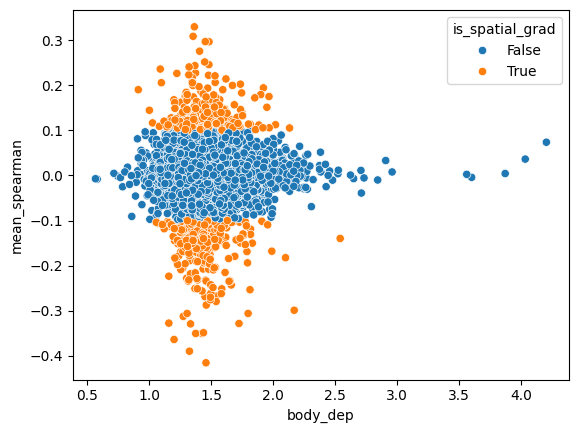

-0.013747007721325977


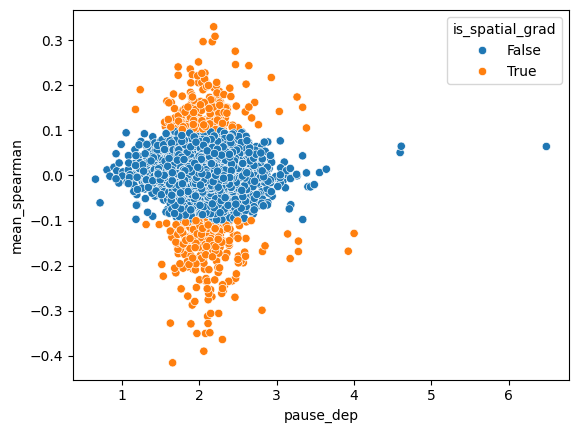

-0.03921333393633776


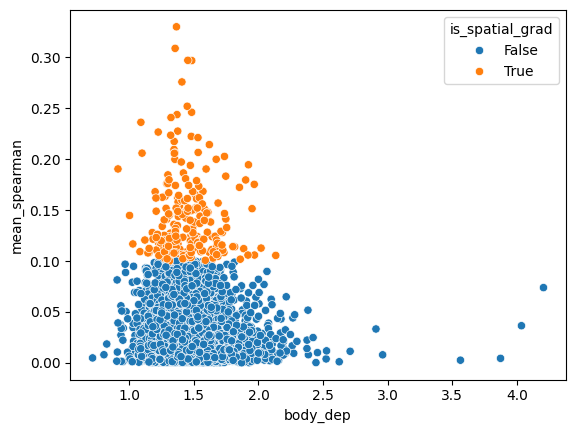

-0.03321289296816349


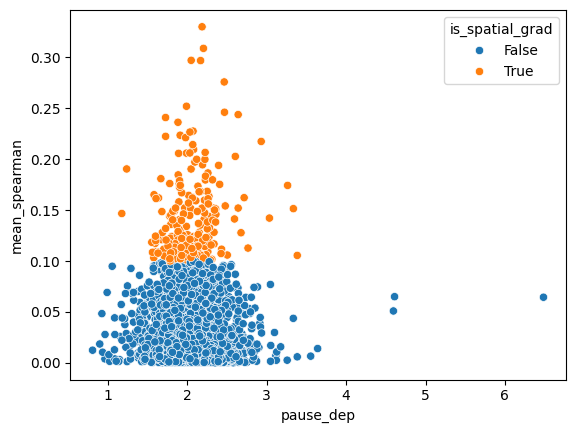

0.06361397073948338


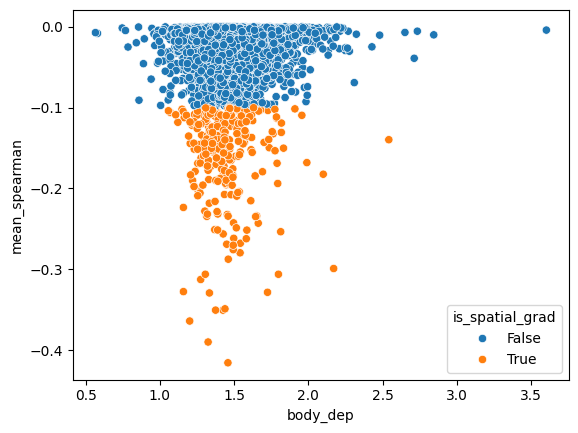

0.0253783952847552


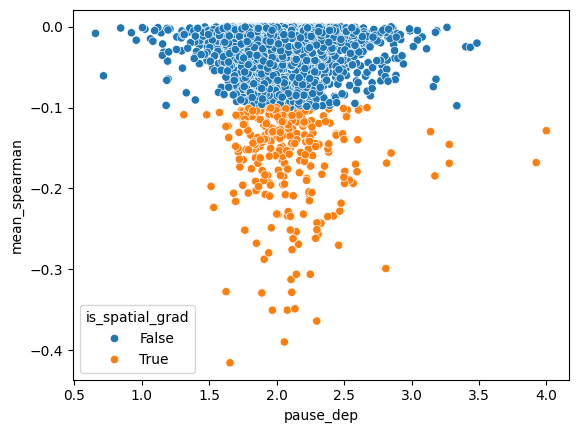

-0.09383197514042418


In [82]:
sns.scatterplot(data=df_spatial_grad, x="body_dep", y="mean_spearman", hue="is_spatial_grad"); plt.show()
print(df_spatial_grad[["body_dep", "mean_spearman"]].corr().values[0,1])
sns.scatterplot(data=df_spatial_grad, x="pause_dep", y="mean_spearman", hue="is_spatial_grad"); plt.show()
print(df_spatial_grad[["pause_dep", "mean_spearman"]].corr().values[0,1])

sns.scatterplot(data=df_spatial_grad_pos, x="body_dep", y="mean_spearman", hue="is_spatial_grad"); plt.show()
print(df_spatial_grad_pos[["body_dep", "mean_spearman"]].corr().values[0,1])
sns.scatterplot(data=df_spatial_grad_pos, x="pause_dep", y="mean_spearman", hue="is_spatial_grad"); plt.show()
print(df_spatial_grad_pos[["pause_dep", "mean_spearman"]].corr().values[0,1])

sns.scatterplot(data=df_spatial_grad_neg, x="body_dep", y="mean_spearman", hue="is_spatial_grad"); plt.show()
print(df_spatial_grad_neg[["body_dep", "mean_spearman"]].corr().values[0,1])
sns.scatterplot(data=df_spatial_grad_neg, x="pause_dep", y="mean_spearman", hue="is_spatial_grad"); plt.show()
print(df_spatial_grad_neg[["pause_dep", "mean_spearman"]].corr().values[0,1])

### Clauclte taf1 related gens spatilly

In [100]:
bican_md1 = sc.read_h5ad("/home/gdallagl/myworkdir/XDP/data/STR_zonation_references_h5ad/STR_D1_Matrix_MSN.h5ad")
bican_md1

AnnData object with n_obs × n_vars = 46960 × 37905
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'PREFIX', 'CELL_BARCODE', 'NUM_GENIC_READS', 'NUM_TRANSCRIPTS', 'NUM_GENES', 'num_retained_transcripts', 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'donor_external_id', 'is_primary_data', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'donor_id', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'x', 'y', 'RNA_snn_res.0.8', 'seurat_clusters', 'library', 'donor', 'x_um2', 'y_um2', 'unique_cell_ID', 'AK_celltype', 'RNA_snn_res.0.2', 'cb', 'clusters', 'num_dbscan', 'lo

In [109]:
bican_md1.obsm["spatial"] = np.array([bican_md1.obs["x"].values, bican_md1.obs["y"].values]).T
bican_md1.var["gene_symbol"] = bican_md1.var_names
bican_md1.layers["counts"] = bican_md1.X.copy()

In [126]:
scores = {
    "TAF1_body_dep_top1%": df[df["body_dep"] > df["body_dep"].quantile(0.99)]["gene"].values,
    "TAF1_pause_dep_top1%": df[df["pause_dep"] > df["pause_dep"].quantile(0.99)]["gene"].values,
    "": df_spatial_grad_pos[(df_spatial_grad_pos["abs_mean_spearman"] > 0.1) & (df_spatial_grad_pos["pause_dep"] > 2 )]["gene"].values
}   

for score_name, genes in scores.items():
    print(f"Calculating score: {score_name} with {len(genes)} genes.")
    lmu.aucell(bican_md1, genes, score_name)

Calculating score: TAF1_body_dep_top1% with 103 genes.
Mapped 103/103 genes for TAF1_body_dep_top1%
Calculating score: TAF1_pause_dep_top1% with 103 genes.
Mapped 101/103 genes for TAF1_pause_dep_top1%
Calculating score: TAF1_spatial_grad_pos with 133 genes.
Mapped 128/133 genes for TAF1_spatial_grad_pos


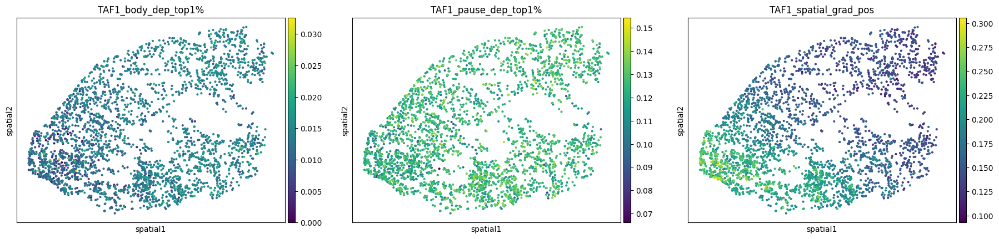

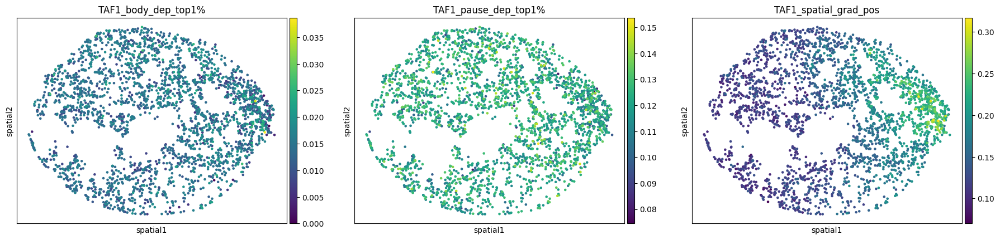

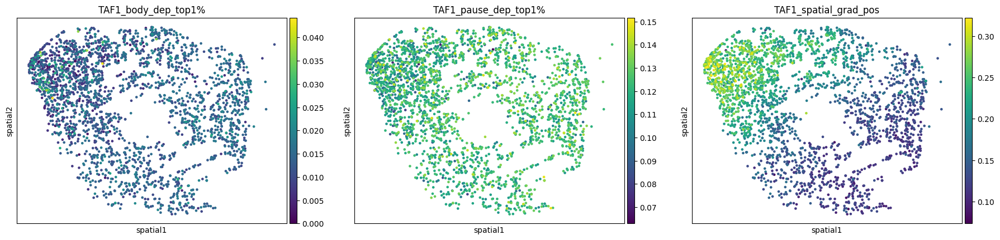

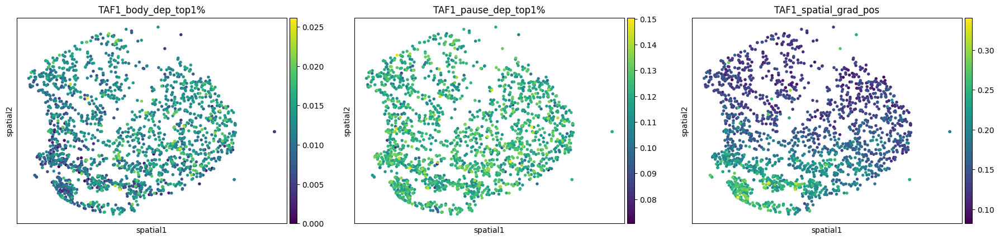

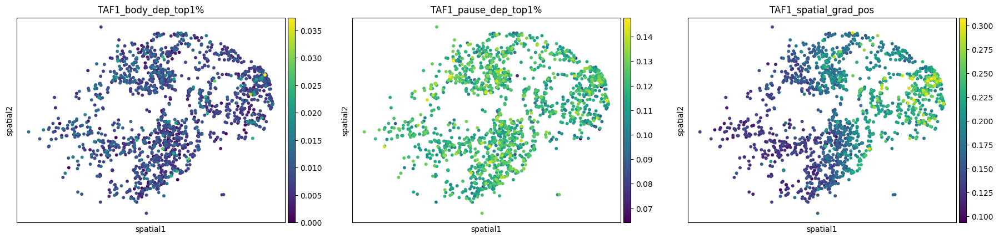

...

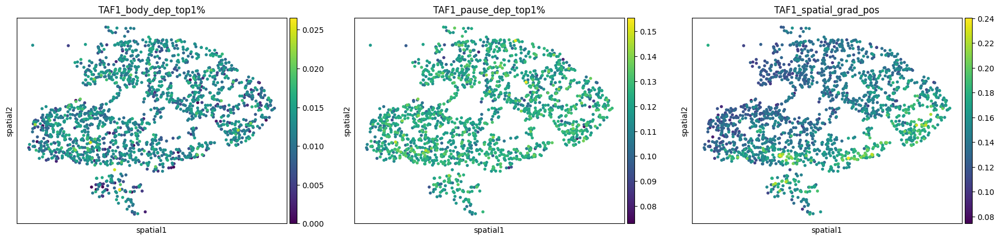

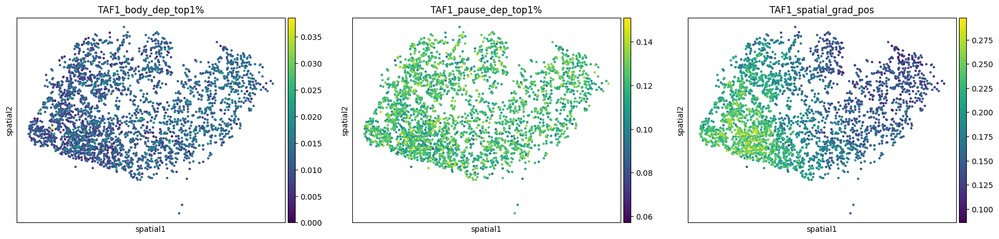

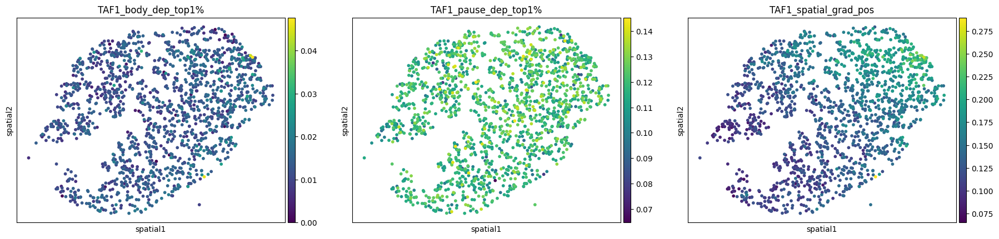

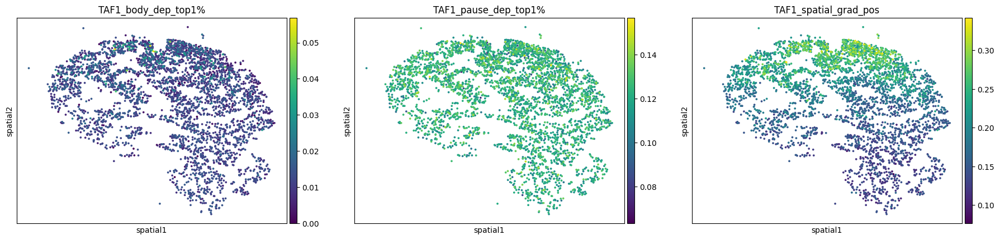

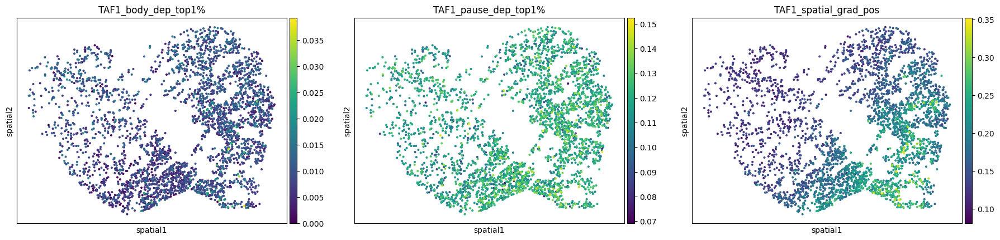

In [127]:
for sample in bican_md1.obs["donor_id"].unique():
    sc.pl.embedding(bican_md1[bican_md1.obs["donor_id"] == sample], basis='spatial', color=scores.keys(), cmap="viridis", ncols=3)
    #break

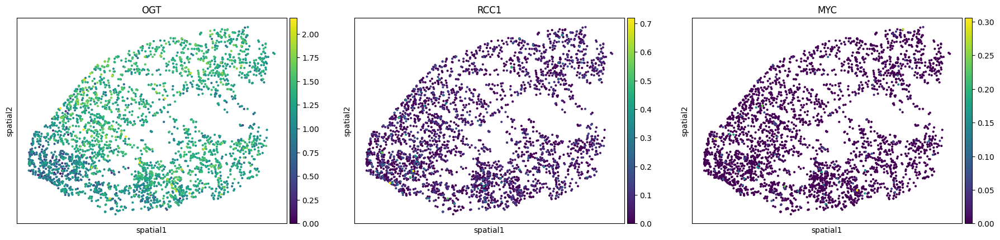

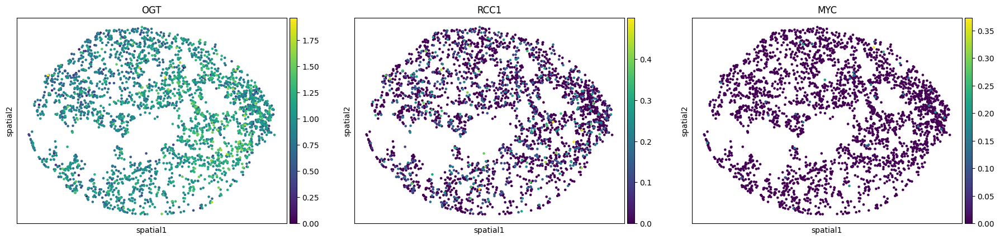

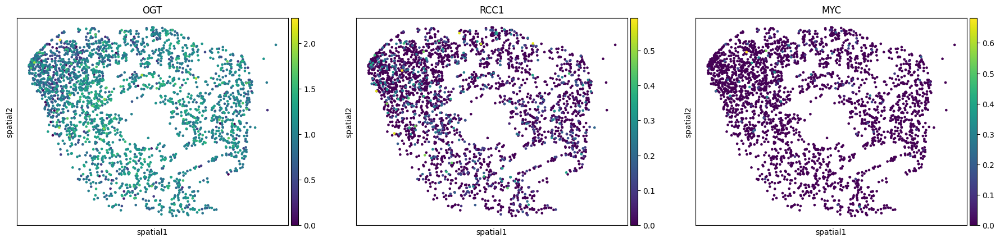

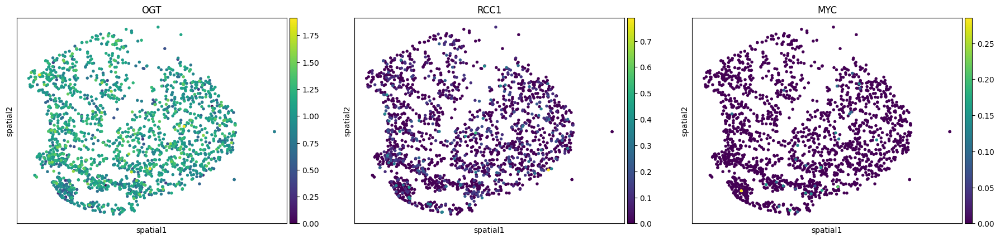

In [132]:
for sample in bican_md1.obs["donor_id"].unique()[:4]:
    sc.pl.embedding(bican_md1[bican_md1.obs["donor_id"] == sample], basis='spatial', color=["OGT", "RCC1", "MYC"], layer="logcounts")
    #break
